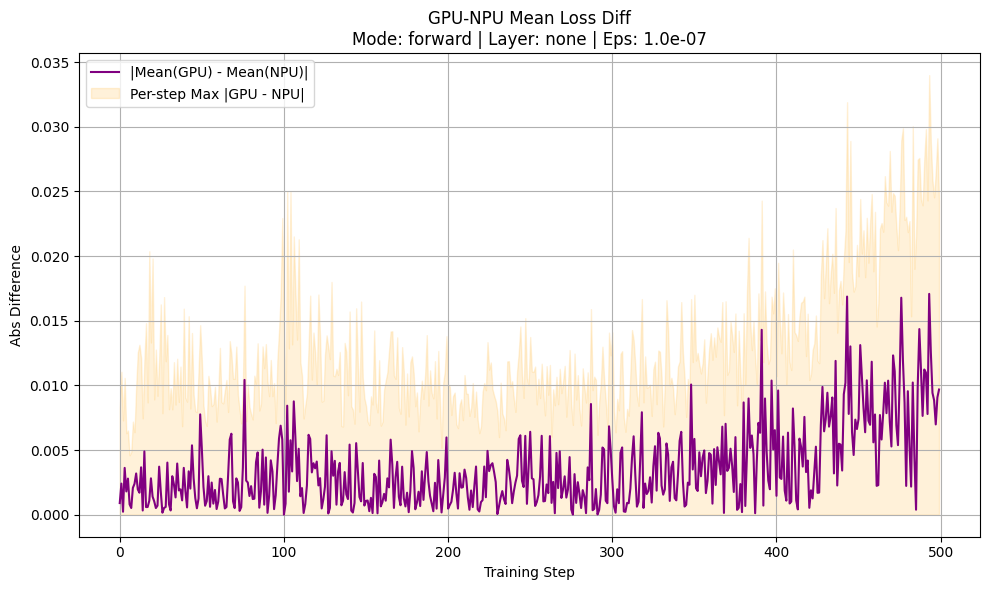

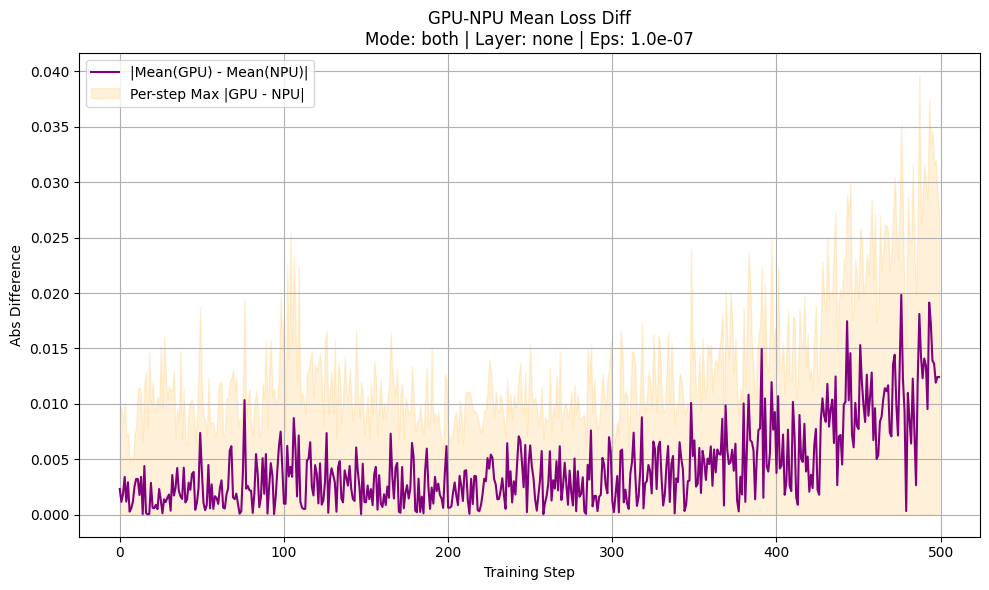

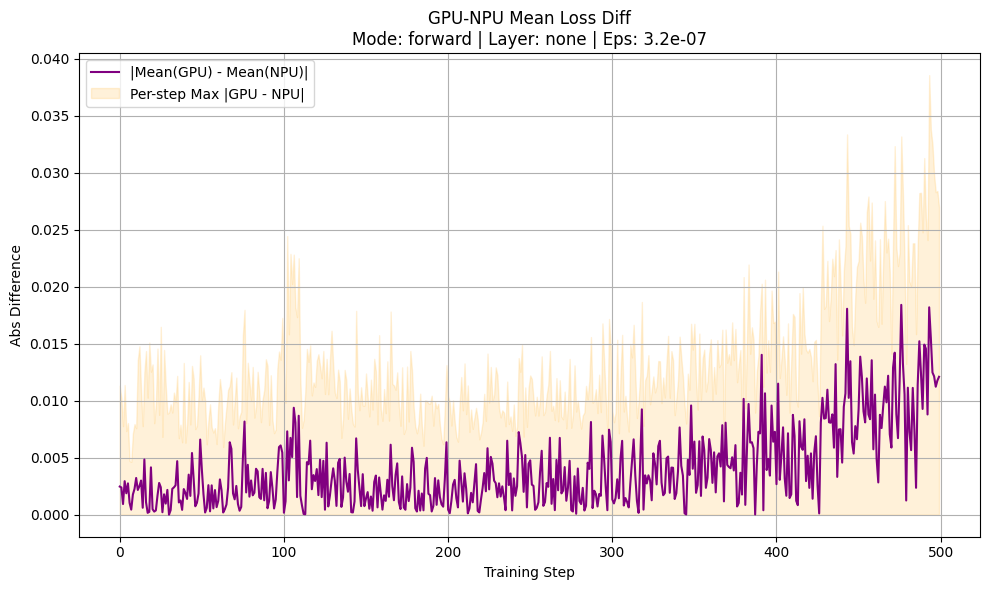

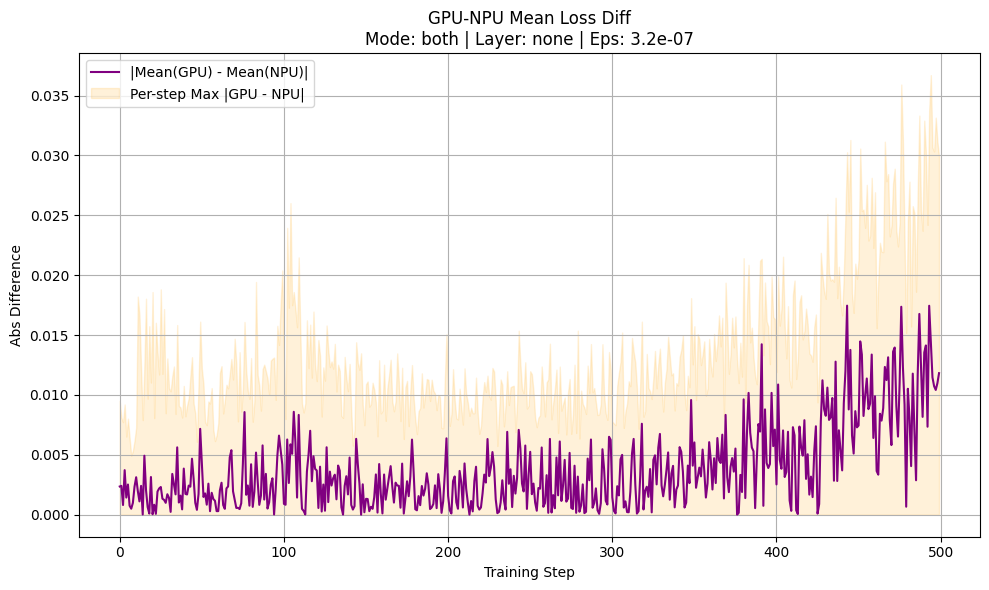

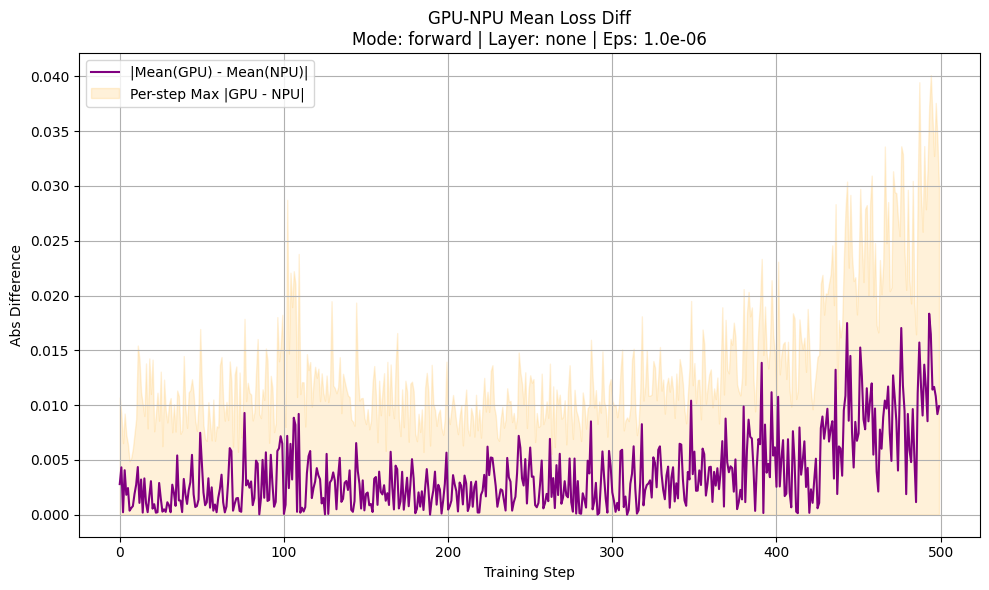

...

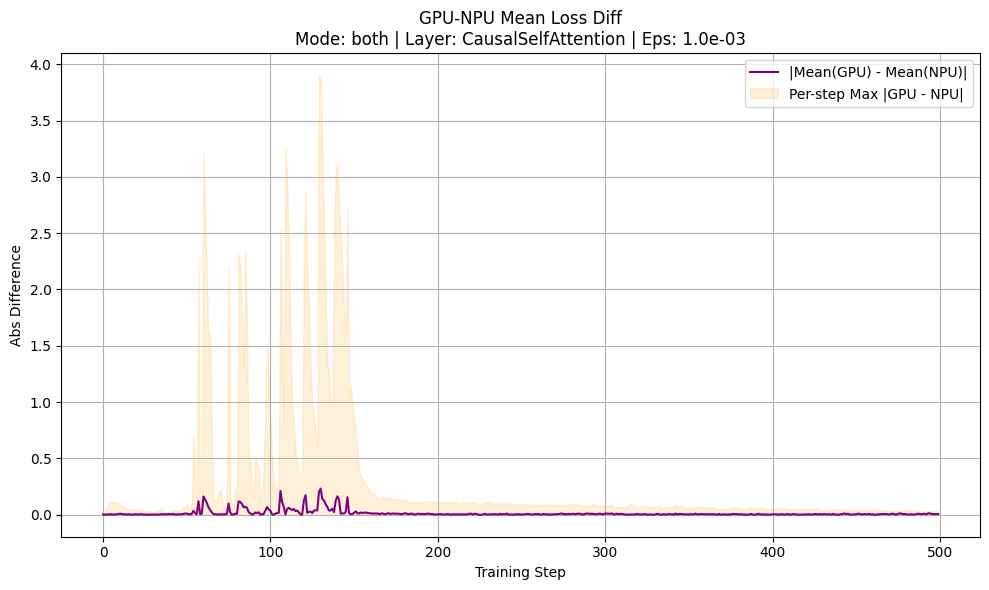

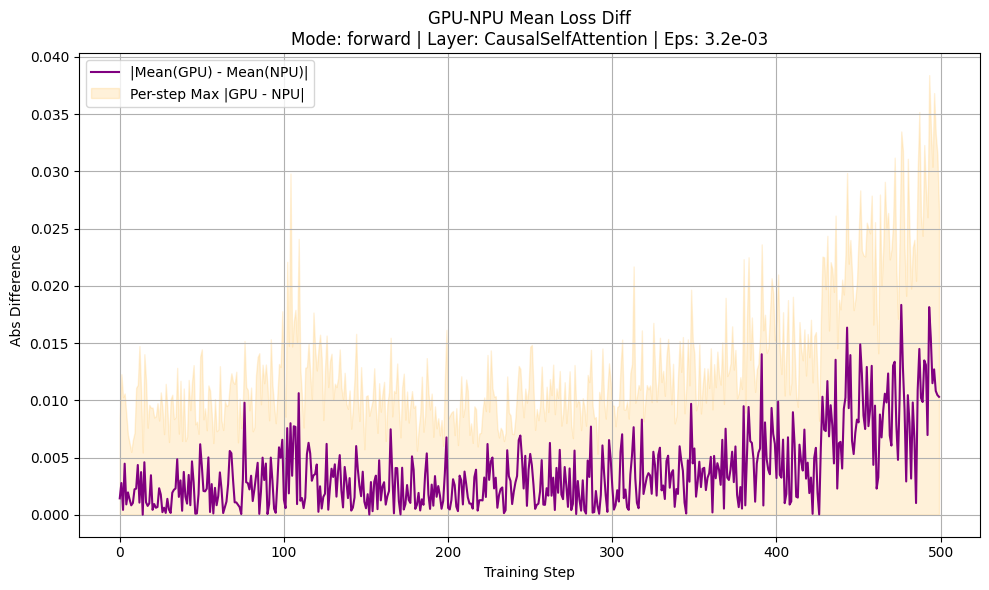

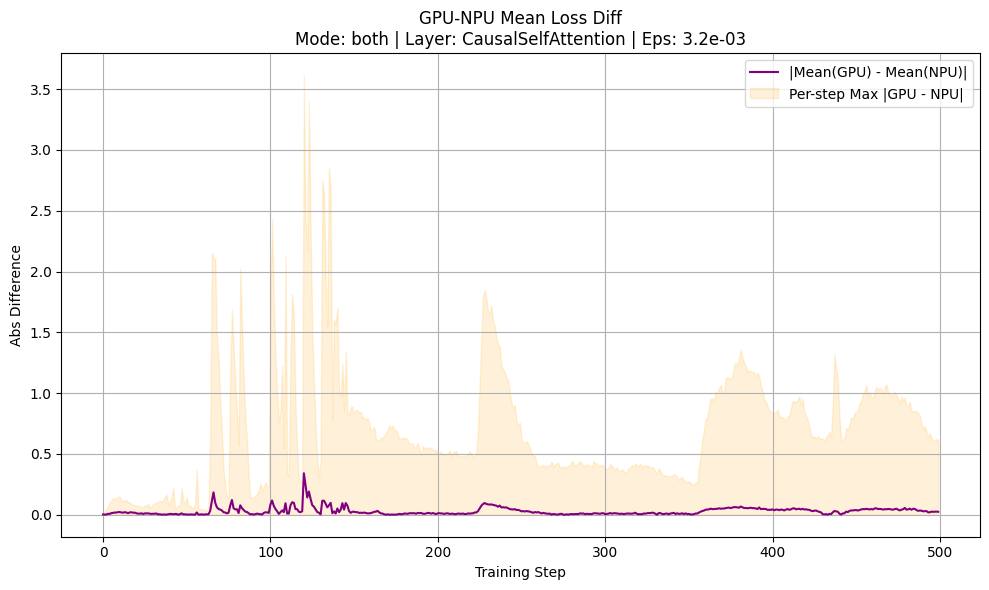

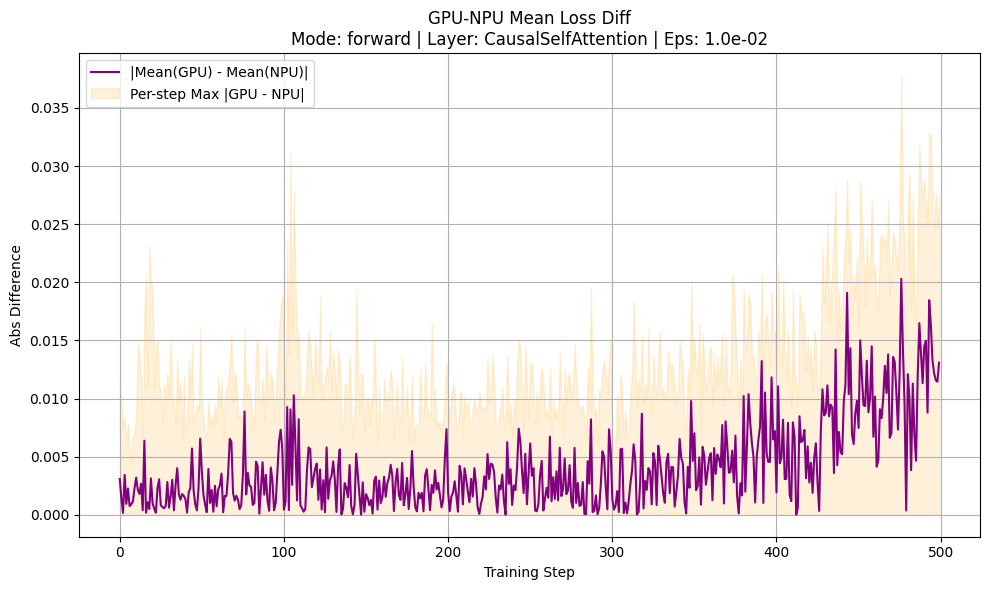

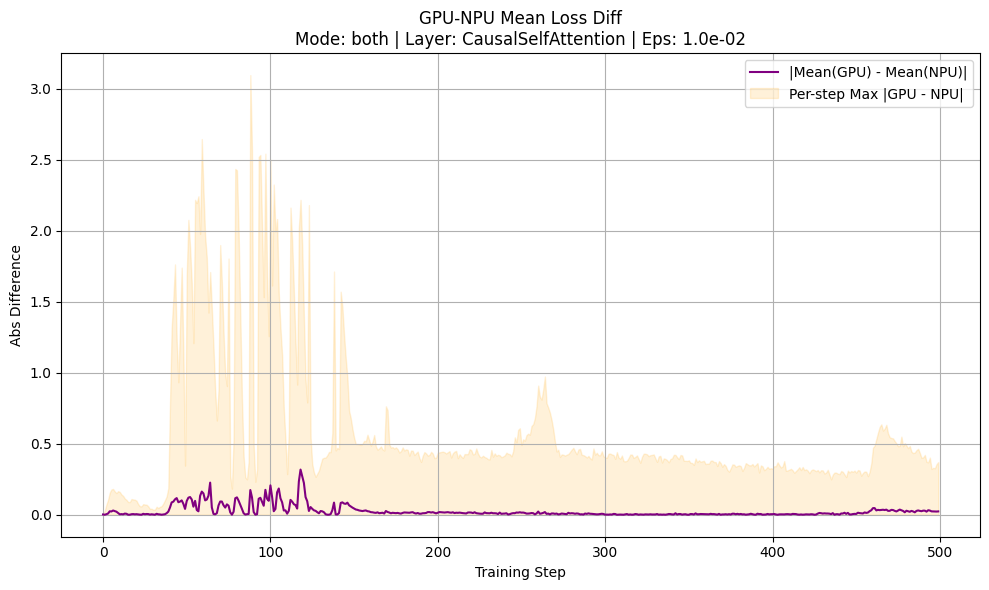

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import re

def sanitize_title(s):
    """将标题转为安全文件名（无冒号和非法字符）"""
    s = s.replace(":", "")
    s = re.sub(r"\s+", "_", s)
    s = s.replace("|", "")
    s = s.replace(".", "p")  # 防止多个小数点
    s = re.sub(r"[^\w\-\.]", "", s)
    return s

# 加载数据
gpu_df = pd.read_csv("summary_GPU.csv")
npu_df = pd.read_csv("summary_NPU.csv")

loss_cols = [f"loss_iter_{i}" for i in range(500)]

baseline_cond = (
    (gpu_df["repeat_id"] == 0) &
    (gpu_df["error_mode"] == "none") &
    (gpu_df["forward_eps"] == 0.0) &
    (gpu_df["grad_eps"] == 0.0) &
    (gpu_df["layer_types"].astype(str) == "[]")
)
gpu_baseline = gpu_df[baseline_cond][loss_cols].values[0].astype(float)
gpu_df = gpu_df[~baseline_cond]

npu_baseline_cond = (
    (npu_df["repeat_id"] == 0) &
    (npu_df["error_mode"] == "none") &
    (npu_df["forward_eps"] == 0.0) &
    (npu_df["grad_eps"] == 0.0) &
    (npu_df["layer_types"].astype(str) == "[]")
)
npu_baseline = npu_df[npu_baseline_cond][loss_cols].values[0].astype(float)
npu_df = npu_df[~npu_baseline_cond]

layer_types = ["none", "MLP", "LayerNorm", "CausalSelfAttention"]
epsilons = np.logspace(-7, -2, num=11).tolist()
modes = ["forward", "both"]

for layer in layer_types:
    for eps in epsilons:
        for mode in modes:
            # 选取对应扰动配置下的GPU与NPU实验
            gpu_subset = gpu_df[
                (gpu_df["layer_types"] == layer) &
                (np.isclose(gpu_df["forward_eps"], eps)) &
                (np.isclose(gpu_df["grad_eps"], eps)) &
                (gpu_df["error_mode"] == mode)
            ]
            npu_subset = npu_df[
                (npu_df["layer_types"] == layer) &
                (np.isclose(npu_df["forward_eps"], eps)) &
                (np.isclose(npu_df["grad_eps"], eps)) &
                (npu_df["error_mode"] == mode)
            ]
            if gpu_subset.empty or npu_subset.empty:
                print(f"跳过空数据：layer={layer}, eps={eps}, mode={mode}")
                continue

            # GPU/NPU所有repeat的loss diff（去掉baseline）
            gpu_diff_matrix = gpu_subset[loss_cols].values.astype(float) - gpu_baseline
            npu_diff_matrix = npu_subset[loss_cols].values.astype(float) - npu_baseline

            # 1. 曲线：每步均值的绝对差
            gpu_mean_curve = np.mean(gpu_diff_matrix, axis=0)
            npu_mean_curve = np.mean(npu_diff_matrix, axis=0)
            abs_mean_diff_curve = np.abs(gpu_mean_curve - npu_mean_curve)

            # 2. 每步最大绝对差（repeat两组两两匹配）
            # 先拼成所有repeat的均值，取max(|g_i - n_j|) 对每步
            max_abs_diff_curve = np.zeros(gpu_mean_curve.shape)
            for t in range(gpu_mean_curve.shape[0]):
                # 每一步的所有repeat
                gpu_vals = gpu_diff_matrix[:, t]
                npu_vals = npu_diff_matrix[:, t]
                # 构造所有repeat间差的绝对值，取最大
                mesh = np.abs(gpu_vals[:, None] - npu_vals[None, :])
                max_abs_diff_curve[t] = np.max(mesh)

            steps = np.arange(len(abs_mean_diff_curve))

            # 绘图
            fig_title = f"GPU-NPU Mean Loss Diff\nMode: {mode} | Layer: {layer} | Eps: {eps:.1e}"
            plt.figure(figsize=(10, 6))
            plt.plot(steps, abs_mean_diff_curve, color="purple", label="|Mean(GPU) - Mean(NPU)|")
            plt.fill_between(steps, 0, max_abs_diff_curve, color="orange", alpha=0.15, label="Per-step Max |GPU - NPU|")
            plt.title(fig_title)
            plt.xlabel("Training Step")
            plt.ylabel("Abs Difference")
            plt.legend()
            plt.grid(True)
            plt.tight_layout()

            # pdf_name = sanitize_title(fig_title) + ".pdf"
            # plt.savefig(pdf_name, format='pdf')
            plt.show()


In [19]:
# 统计mean和std的代码模板
results = {}
for layer in layer_types:
    for mode in modes:
        for eps in epsilons:
            # 选取对应扰动配置下的GPU与NPU实验
            gpu_subset = gpu_df[
                (gpu_df["layer_types"] == layer) &
                (np.isclose(gpu_df["forward_eps"], eps)) &
                (np.isclose(gpu_df["grad_eps"], eps)) &
                (gpu_df["error_mode"] == mode)
            ]
            npu_subset = npu_df[
                (npu_df["layer_types"] == layer) &
                (np.isclose(npu_df["forward_eps"], eps)) &
                (np.isclose(npu_df["grad_eps"], eps)) &
                (npu_df["error_mode"] == mode)
            ]
            if gpu_subset.empty or npu_subset.empty:
                print(f"跳过空数据：layer={layer}, eps={eps}, mode={mode}")
                continue
            # 计算mean±std
            # loss_diff_curve的统计
            gpu_diff_matrix = gpu_subset[loss_cols].values.astype(float) - gpu_baseline
            npu_diff_matrix = npu_subset[loss_cols].values.astype(float) - npu_baseline

            # 所有repeat对，所有步的差的分布
            mean_curve, std_curve = [], []
            for t in range(gpu_diff_matrix.shape[1]):
                gpu_vals = gpu_diff_matrix[:, t]
                npu_vals = npu_diff_matrix[:, t]
                diffs = gpu_vals[:, None] - npu_vals[None, :]
                flat_diffs = diffs.flatten()
                mean_curve.append(np.mean(flat_diffs))
                std_curve.append(np.std(flat_diffs))
            # 聚合全局均值、方差（如全步均值，或用最大/稳态均值等）
            mean_mean = np.mean(mean_curve)
            mean_std = np.mean(std_curve)
            # 存储
            results[(layer, mode, eps)] = (mean_mean, mean_std)
